##### Copyright 2018 The TensorFlow Authors.

In [1]:
#@title Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# Image classification

## Import TensorFlow and other libraries

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

## Download and explore the dataset

This experiment uses a dataset of about 1,807 photos of keyboards. The dataset contains four sub-directories, one per class:

```
keyboard_photos/
  60pc/
  100pc/
  NP/
  TKL/
```

In [3]:
import pathlib
# image bank without CGI
#dataset_url = "https://drive.google.com/uc?export=download&id=1nZG48cNwW9SBkl99wYEOLrE4rU0n3dda"

# image bank with CGI
dataset_url = "https://drive.google.com/uc?export=download&id=1cjlYOar2QK81eVO4y09zVg96A993gWDT&confirm=t&uuid=f52c46a3-8043-40a6-b6d2-51eccbe81391"

data_dir = tf.keras.utils.get_file('keyboard_photos', origin=dataset_url, untar=True)
data_dir = pathlib.Path(data_dir)

5034229760/5034217125 [==============================] - 85s 0us/step


Here are some keyboards:

153


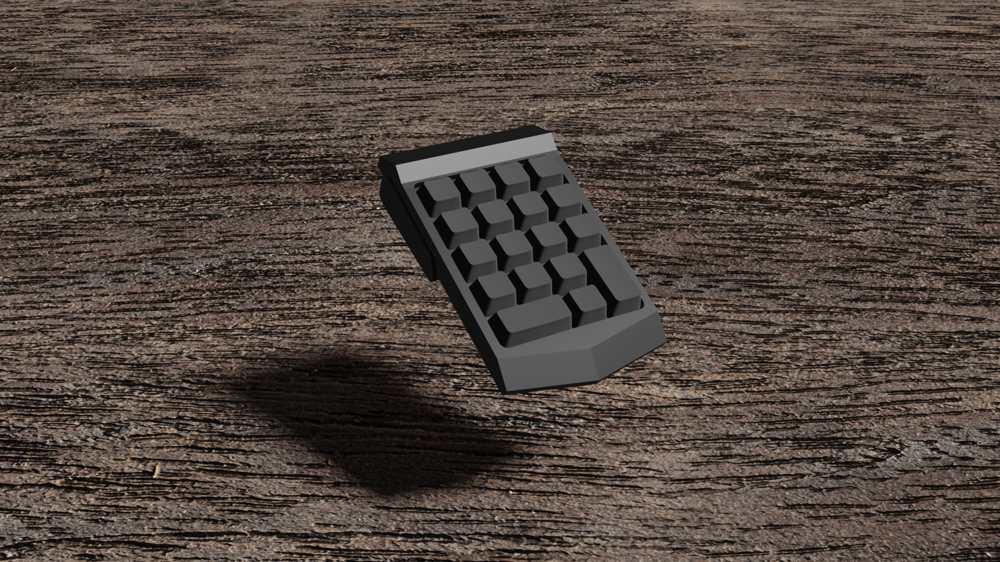

In [4]:
NP = list(data_dir.glob('NP/*'))
print(len(NP))
PIL.Image.open(str(NP[0]))

834


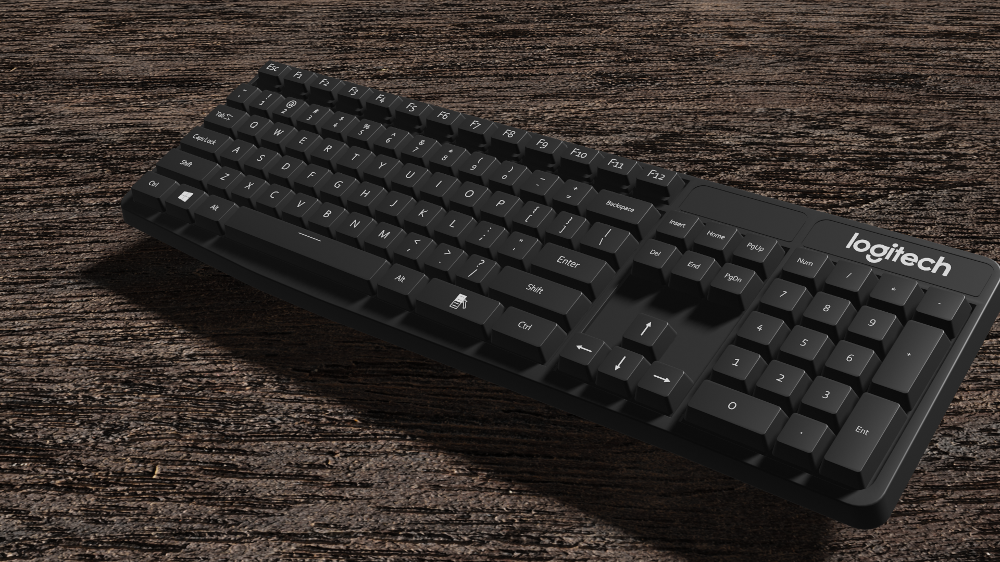

In [5]:
hunpc = list(data_dir.glob('100pc/*'))
print(len(hunpc))
PIL.Image.open(str(hunpc[0]))

# Load data using a Keras utility

Let's load these images off disk using the helpful `tf.keras.utils.image_dataset_from_directory` utility. This will take you from a directory of images on disk to a `tf.data.Dataset` in just a couple lines of code. If you like, you can also write your own data loading code from scratch by visiting the [Load and preprocess images](../load_data/images.ipynb) tutorial.

## Create a dataset

Define some parameters for the loader:

In [6]:
batch_size = 32
img_height = 180
img_width = 320

80% of the images are for training, and 20% for validation.

In [7]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 1807 files belonging to 4 classes.
Using 1446 files for training.


In [8]:
val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 1807 files belonging to 4 classes.
Using 361 files for validation.


You can find the class names in the `class_names` attribute on these datasets. These correspond to the directory names in alphabetical order.

In [9]:
class_names = train_ds.class_names
print(class_names)

['100pc', '60pc', 'NP', 'TKL']


## Visualize the data

Here are the first nine images from the training dataset:

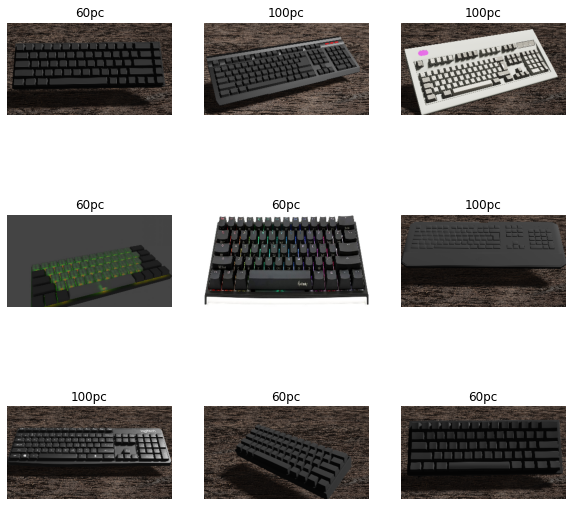

In [10]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

Train a model using these datasets by passing them to `Model.fit`.

The `image_batch` is a tensor of the shape `(32, 180, 320, 3)`. This is a batch of 32 images of shape `180x320x3` (the last dimension refers to color channels RGB). The `label_batch` is a tensor of the shape `(32,)`, these are corresponding labels to the 32 images.

You can call `.numpy()` on the `image_batch` and `labels_batch` tensors to convert them to a `numpy.ndarray`.


## Configure the dataset for performance

Let's make sure to use buffered prefetching so you can yield data from disk without having I/O become blocking. These are two important methods you should use when loading data:

- `Dataset.cache` keeps the images in memory after they're loaded off disk during the first epoch. This will ensure the dataset does not become a bottleneck while training your model. If your dataset is too large to fit into memory, you can also use this method to create a performant on-disk cache.
- `Dataset.prefetch` overlaps data preprocessing and model execution while training.

Interested readers can learn more about both methods, as well as how to cache data to disk in the *Prefetching* section of the [Better performance with the tf.data API](../../guide/data_performance.ipynb) guide.

In [11]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

## Standardize the data

The RGB channel values are in the `[0, 255]` range. This is not ideal for a neural network; in general you should seek to make your input values small.

Here, you will standardize values to be in the `[0, 1]` range by using `tf.keras.layers.Rescaling`:

In [12]:
normalization_layer = layers.Rescaling(1./255)

There are two ways to use this layer. You can apply it to the dataset by calling `Dataset.map`:

In [13]:
normalized_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]
# Notice the pixel values are now in `[0,1]`.
print(np.min(first_image), np.max(first_image)) 

0.0009803922 0.80098045


Or, you can include the layer inside your model definition, which can simplify deployment. Let's use the second approach here.

Note: You previously resized images using the `image_size` argument of `tf.keras.utils.image_dataset_from_directory`. If you want to include the resizing logic in your model as well, you can use the `tf.keras.layers.Resizing` layer.

# Create the model

The [Sequential](https://www.tensorflow.org/guide/keras/sequential_model) model consists of three convolution blocks (`tf.keras.layers.Conv2D`) with a max pooling layer (`tf.keras.layers.MaxPooling2D`) in each of them. There's a fully-connected layer (`tf.keras.layers.Dense`) with 128 units on top of it that is activated by a ReLU activation function (`'relu'`). This model has not been tuned for high accuracy—the goal of this tutorial is to show a standard approach.

In [14]:
num_classes = len(class_names)

model = Sequential([
  layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

## Compile the model

For this tutorial, choose the `tf.keras.optimizers.Adam` optimizer and `tf.keras.losses.SparseCategoricalCrossentropy` loss function. To view training and validation accuracy for each training epoch, pass the `metrics` argument to `Model.compile`.

In [15]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

## Model summary

View all the layers of the network using the model's `Model.summary` method:

In [16]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_1 (Rescaling)     (None, 180, 320, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 180, 320, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 90, 160, 16)      0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 90, 160, 32)       4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 45, 80, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 45, 80, 64)        1

## Train the model

In [17]:
epochs=10
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/10
46/46 [==============================] - 36s 539ms/step - loss: 1.2540 - accuracy: 0.5609 - val_loss: 0.5026 - val_accuracy: 0.8199
Epoch 2/10
46/46 [==============================] - 2s 40ms/step - loss: 0.2609 - accuracy: 0.9267 - val_loss: 0.1978 - val_accuracy: 0.9557
Epoch 3/10
46/46 [==============================] - 2s 38ms/step - loss: 0.1016 - accuracy: 0.9689 - val_loss: 0.1103 - val_accuracy: 0.9640
Epoch 4/10
46/46 [==============================] - 2s 38ms/step - loss: 0.0486 - accuracy: 0.9876 - val_loss: 0.1093 - val_accuracy: 0.9668
Epoch 5/10
46/46 [==============================] - 2s 38ms/step - loss: 0.0280 - accuracy: 0.9896 - val_loss: 0.1013 - val_accuracy: 0.9640
Epoch 6/10
46/46 [==============================] - 2s 38ms/step - loss: 0.0129 - accuracy: 0.9965 - val_loss: 0.0957 - val_accuracy: 0.9640
Epoch 7/10
46/46 [==============================] - 2s 38ms/step - loss: 0.0206 - accuracy: 0.9945 - val_loss: 0.1229 - val_accuracy: 0.9695
Epoch 8/10


## Visualize training results

Create plots of loss and accuracy on the training and validation sets:

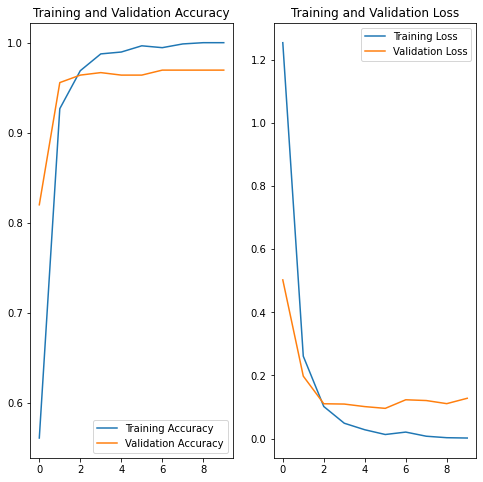

In [18]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

## Data augmentation

Overfitting generally occurs when there are a small number of training examples. [Data augmentation](./data_augmentation.ipynb) takes the approach of generating additional training data from your existing examples by augmenting them using random transformations that yield believable-looking images. This helps expose the model to more aspects of the data and generalize better.

You will implement data augmentation using the following Keras preprocessing layers: `tf.keras.layers.RandomFlip`, `tf.keras.layers.RandomRotation`, and `tf.keras.layers.RandomZoom`. These can be included inside your model like other layers, and run on the GPU.

In [19]:
data_augmentation = keras.Sequential(
  [
    layers.RandomFlip("horizontal",
                      input_shape=(img_height,
                                  img_width,
                                  3)),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
  ]
)

Let's visualize what a few augmented examples look like by applying data augmentation to the same image several times:

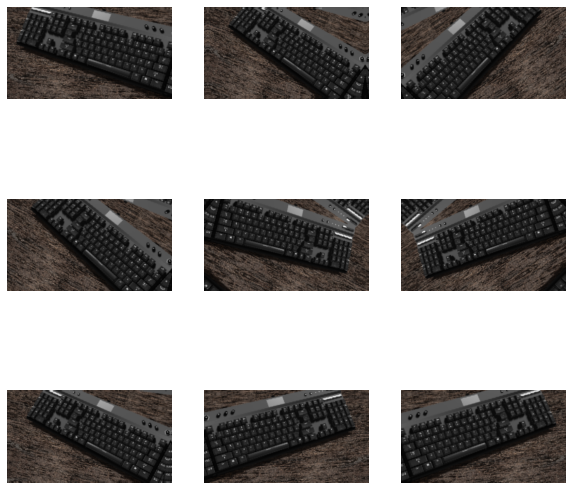

In [20]:
plt.figure(figsize=(10, 10))
for images, _ in train_ds.take(1):
  for i in range(9):
    augmented_images = data_augmentation(images)
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(augmented_images[0].numpy().astype("uint8"))
    plt.axis("off")

You will use data augmentation to train a model in a moment.

## Dropout

Another technique to reduce overfitting is to introduce [dropout](https://developers.google.com/machine-learning/glossary#dropout_regularization) regularization to the network.

When you apply dropout to a layer, it randomly drops out (by setting the activation to zero) a number of output units from the layer during the training process. Dropout takes a fractional number as its input value, in the form such as 0.1, 0.2, 0.4, etc. This means dropping out 10%, 20% or 40% of the output units randomly from the applied layer.

Let's create a new neural network with `tf.keras.layers.Dropout` before training it using the augmented images:

In [21]:
model = Sequential([
  data_augmentation,
  layers.Rescaling(1./255),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout(0.2),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

## Compile and train the model

In [22]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [23]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_1 (Sequential)   (None, 180, 320, 3)       0         
                                                                 
 rescaling_2 (Rescaling)     (None, 180, 320, 3)       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 180, 320, 16)      448       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 90, 160, 16)      0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 90, 160, 32)       4640      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 45, 80, 32)       0         
 2D)                                                  

In [24]:
epochs = 15
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/15
46/46 [==============================] - 3s 46ms/step - loss: 1.3105 - accuracy: 0.4405 - val_loss: 0.8765 - val_accuracy: 0.5402
Epoch 2/15
46/46 [==============================] - 2s 41ms/step - loss: 0.7285 - accuracy: 0.7019 - val_loss: 0.5643 - val_accuracy: 0.7729
Epoch 3/15
46/46 [==============================] - 2s 42ms/step - loss: 0.5487 - accuracy: 0.8091 - val_loss: 0.3840 - val_accuracy: 0.8698
Epoch 4/15
46/46 [==============================] - 2s 41ms/step - loss: 0.3891 - accuracy: 0.8797 - val_loss: 0.3433 - val_accuracy: 0.8975
Epoch 5/15
46/46 [==============================] - 2s 42ms/step - loss: 0.2866 - accuracy: 0.9142 - val_loss: 0.6160 - val_accuracy: 0.7507
Epoch 6/15
46/46 [==============================] - 2s 42ms/step - loss: 0.2676 - accuracy: 0.9129 - val_loss: 0.3736 - val_accuracy: 0.8781
Epoch 7/15
46/46 [==============================] - 2s 42ms/step - loss: 0.2018 - accuracy: 0.9398 - val_loss: 0.1760 - val_accuracy: 0.9557
Epoch 8/15
46

## Visualize training results

After applying data augmentation and `tf.keras.layers.Dropout`, there is less overfitting than before, and training and validation accuracy are closer aligned:

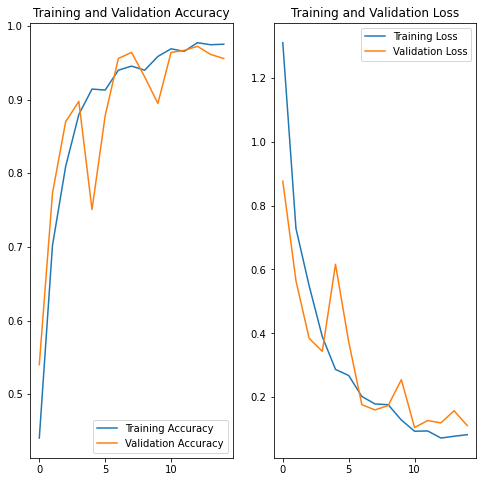

In [25]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

## Predict on new data

Finally, let's use our model to classify an image that wasn't included in the training or validation sets.

Note: Data augmentation and dropout layers are inactive at inference time.

In [26]:
keyboard_url = "https://drive.google.com/uc?export=download&id=1Kt1x5hgQUmcFe_o3xbt3cJvHJ9L8EmBo"
keyboard_path = tf.keras.utils.get_file('9', origin = keyboard_url)
img = tf.keras.utils.load_img(keyboard_path, target_size=(img_height, img_width))
img_array = tf.keras.utils.img_to_array(img)
img_array = tf.expand_dims(img_array, 0) # Create a batch
predictions = model.predict(img_array)
score = tf.nn.softmax(predictions[0])
print("This image most likely belongs to {} with a {:.2f} percent confidence.".format(class_names[np.argmax(score)], 100 * np.max(score)))

2678784/2665237 [==============================] - 0s 0us/step
This image most likely belongs to TKL with a 100.00 percent confidence.
